### Topic 1: Structural Properties of LADs
# Example tracks and heatmaps

In [1]:
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from glob import glob
from scipy.signal import gaussian, fftconvolve
from matplotlib import gridspec
from scipy import signal
from scipy import stats

import sys
sys.path.append('../../combining_all_data/bin/')
sys.path.append('../bin/')
from preimplantation_toolkit import *
import preimplantation_load_data as ld

rs = np.random.RandomState()
rs.seed(42)

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

FIGOUTDIR = '../output/figures/1_Preimplantation.structural_properties_of_LADs.part0.example_tracks/'

In [3]:
! mkdir -p $FIGOUTDIR || true;

In [4]:
HOME = '/Users/f.rang/surfdrive/Kind/data/'

BINSIZE = 100000
MINMAP_PER_KB = 1
MINMAP = int(MINMAP_PER_KB * BINSIZE / 1000)

ANNOFN = '../../combining_all_data/metadata/FR230814.samplesheet.tsv'
COLORFN = '../colors/manuscript_colors.tsv'

COUNTS = '../../combining_all_data/data/damid_counts/FR230814.DamID.sample_counts.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
BINARY = '../../combining_all_data/data/damid_binary/FR230814.DamID.sample_smooth_binary.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
CONTFC = '../../combining_all_data/data/damid_CF/FR230814.DamID.contact_frequency.{construct}.{stage}.{treatment}.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
INSILICO = '../../combining_all_data/data/damid_insilico/FR230814.DamID.insilico_counts.{construct}.{stage}.{treatment}.{genotype}.{sample}_samples.damid_pass.binsize_{binsize:d}.hdf5'

MAPFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.bowtie2_very_sensitive_N1.readlength_65.counts.pos.hdf5"
POSFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.posarray.hdf5"

ALLELEFILTFN = '../../combining_all_data/data/damid_allelic_filter/FR230814.allelic_filter_based_on_visibility_and_bias.{genotype}.binsize_{binsize:d}.hdf5'

# CELseq file names
CELSEQCOUNTS = '../../combining_all_data/data/celseq_counts/FR230814.CELseq.sample_counts.{genotype}.celseq_pass.tsv.gz'
# Gene information
GENESFN = HOME + 'references/mouse/mm10/genomic_element_info/FR200630.BioMart.mm10.all_genes.top_transcripts.txt.gz'



# 1. Loading Kind data

In [5]:
color_dict = ld.load_color_dict(COLORFN)

## 1.1 Loading samplesheet

In [6]:
stage_order = ['zygote', '2cell', '8cell', 'mESC']
chrom_order = [str(c) for c in range(1,20)] + ['X', 'Y']

In [7]:
anno = pd.read_csv(ANNOFN, sep='\t', dtype={'number_embryos': str})

## select samples passing quality filters
anno = anno[anno.DamID_PASS]

## select conditions of interest
anno = anno[anno['stage'].isin(stage_order)]
anno = anno[anno.cellcount == 1]

ind = (anno.construct=='Cbx1(CD)') & anno.treatment.isin(['EED_mKO', 'EED_ctrl'])
anno = anno[~ind]

# setting stage order
anno['stage'] = pd.Categorical(anno['stage'], categories=stage_order)
anno = anno.set_index(anno['damid_name'])

anno.head()

,runid,illumina_index,damid2_adapter_number,celseq2_adapter_number,cellcount,construct,fusion_construct,stage,treatment,genotype,...,nGenes,nTranscripts,nTranscripts_maternal,nTranscripts_paternal,allelic_celseq_balance,nERCC,nMito,DamID_PASS,DamID_PASS_allelic,CELseq_PASS
damid_name,,,,,,,,,,,,,,,,,,,,,
KIN1971.index03.DamID2_BC_001,KIN1971,3,1,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,0,NaN,NaN,NaN,0,0,True,True,False
KIN1971.index03.DamID2_BC_009,KIN1971,3,9,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,0,NaN,NaN,NaN,0,0,True,True,False
KIN1971.index03.DamID2_BC_017,KIN1971,3,17,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,0,NaN,NaN,NaN,0,0,True,True,False
KIN1971.index03.DamID2_BC_025,KIN1971,3,25,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,0,NaN,NaN,NaN,0,0,True,True,False
KIN1971.index03.DamID2_BC_033,KIN1971,3,33,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,0,NaN,NaN,NaN,0,0,True,True,False


In [8]:
tmp = anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment']).size()
tmp[tmp>0]

fusion_construct    stage   genotype                treatment     
Cbx1(FL)-Dam        2cell   homozygous              no_treatment       27
Dam-Cbx1(CD)        2cell   homozygous              no_treatment       37
Dam-Lmnb1           zygote  CBAB6F1_x_CAST/EiJ      no_treatment       14
                            homozygous              no_treatment      107
                    2cell   C57BL/6J_x_JF1/Ms       EED_ctrl           87
                                                    EED_mKO            54
                            CBAB6F1_x_CAST/EiJ      Cbx7(CD)-Lap2b     39
                                                    Lap2b              11
                                                    no_treatment       26
                            homozygous              Cbx7(CD)-Emd       17
                                                    Cbx7(CD)-Lap2b     28
                                                    Cbx7(CD)-Lbr       22
                                             

In [9]:
tmp = anno[anno.DamID_PASS_allelic].groupby(['fusion_construct', 'stage', 'genotype', 'treatment']).size()
tmp[tmp>0]

fusion_construct    stage   genotype                treatment     
Cbx1(FL)-Dam        2cell   homozygous              no_treatment       27
Dam-Cbx1(CD)        2cell   homozygous              no_treatment       37
Dam-Lmnb1           zygote  CBAB6F1_x_CAST/EiJ      no_treatment       13
                            homozygous              no_treatment      107
                    2cell   C57BL/6J_x_JF1/Ms       EED_ctrl           51
                                                    EED_mKO            31
                            CBAB6F1_x_CAST/EiJ      Cbx7(CD)-Lap2b     39
                                                    Lap2b              10
                                                    no_treatment       21
                            homozygous              Cbx7(CD)-Emd       17
                                                    Cbx7(CD)-Lap2b     28
                                                    Cbx7(CD)-Lbr       22
                                             

## 1.2 Loading mappability

In [10]:
GENOTYPE2PARENT = {
    '129S1/SvImJ_x_CAST/EiJ': {
        'maternal': 'unique_129S1_SvImJ_snps',
        'paternal': 'unique_CAST_EiJ_snps'
    },
    
    'CBAB6F1_x_CAST/EiJ': {
        'maternal': 'unique_CBABL6F1_snps',
        'paternal': 'unique_CAST_snps'
    },
    
    'C57BL/6J_x_JF1/Ms': {
        'maternal': 'unique_C57BL_6J_snps',
        'paternal': 'unique_JF1_Ms_snps'
    }
}

In [11]:
mapab = ld.load_mappability(POSFN, MAPFN, chrom_order, BINSIZE)

In [12]:
mapab_gt = ld.load_mapab_from_count_file_heterozygous(COUNTS, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

## 1.3 Loading DamID data

__DamID sample counts__

In [13]:
damid_counts = ld.load_sample_damid_counts_heterozygous(COUNTS, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

Cbx1(FL)-Dam homozygous combined
Dam-Cbx1(CD) homozygous combined
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ maternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ paternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ combined
Dam-Lmnb1 C57BL/6J_x_JF1/Ms maternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms paternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms combined
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ maternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ paternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ combined
Dam-Lmnb1 homozygous combined
Dam-aH3K27me3 homozygous combined
Dam-aH3K27me3(mut) homozygous combined
Dam-only homozygous combined


__DamID binary data__

In [14]:
damid_binary = ld.load_sample_damid_binary_heterozygous(BINARY, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

Loading Dam-normalized binary data for Cbx1(FL)-Dam (homozygous) data
Cbx1(FL)-Dam homozygous combined
Loading Dam-normalized binary data for Dam-Cbx1(CD) (homozygous) data
Dam-Cbx1(CD) homozygous combined
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ maternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ paternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ combined
Dam-Lmnb1 C57BL/6J_x_JF1/Ms maternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms paternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms combined
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ maternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ paternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ combined
Dam-Lmnb1 homozygous combined
Loading Dam-normalized binary data for Dam-aH3K27me3 (homozygous) data
Dam-aH3K27me3 homozygous combined
Loading Dam-normalized binary data for Dam-aH3K27me3(mut) (homozygous) data
Dam-aH3K27me3(mut) homozygous combined
Dam-only homozygous combined


__Contact Frequency__

In [15]:
if BINSIZE >= 100000:
    contact_freq =  {p: dict() for p in ['maternal', 'paternal', 'combined']}

    for info, df in anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous']):
        
        parents = ['combined', 'maternal', 'paternal'] if info[-1] else ['combined']
        
        for parent in parents:

            if parent == 'combined':
                gt_name = info[2] if not info[-1] else info[2].replace('/','') + '.combined'
            else:
                gt_name = info[2].replace('/','') + '.' + GENOTYPE2PARENT[info[2]][parent]

            fn = CONTFC.format(construct = info[0], stage = info[1], treatment = info[3], genotype = gt_name, binsize=BINSIZE)
            if info[0] not in ['Dam-only', 'Dam-Lmnb1']:
                fn = fn.replace('contact_frequency', 'contact_frequency_damnorm')

            name = (info[0], info[1], info[2], info[3])

            if len(glob(fn)) == 0:
                print('CF does not exist for', parent, info)
                continue

            contact_freq[parent][name] =  load_count_file(fn)

__in silico populations__

In [16]:
from collections import defaultdict

In [17]:
damid_insilico = {p: dict() for p in ['maternal', 'paternal', 'combined']}

for info, df in anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous']):
    
    parents = ['combined', 'maternal', 'paternal'] if info[-1] else ['combined']
    
    for parent in parents:
        
        # load combined
        if parent == 'combined':
            gt_name = info[2] if not info[-1] else info[2].replace('/','') + '.combined'
        else:
            gt_name = info[2].replace('/','') + '.' + GENOTYPE2PARENT[info[2]][parent]
        
        fn = INSILICO.format(
            construct = info[0], stage = info[1], treatment = info[3], 
            sample = '1cell', genotype = gt_name, binsize=BINSIZE
        )
        
        fns = glob(fn)
        assert len(fns) == 1
        fn = fns[0]
        name = (info[0], info[1], info[2], info[3])

        counts = load_count_file(fn)
        counts = {c: counts[c].astype(int) for c in chrom_order}

        damid_insilico[parent][name] = counts

__RPKM-normalization of in silico populations__

In [18]:
damid_insilico_rpkm = {p: dict() for p in ['maternal', 'paternal', 'combined']}

for parent in damid_insilico:
    for sample in damid_insilico[parent]:

        gt = sample[1]

        if parent in ['maternal', 'paternal']:
            dm = sum([damid_insilico['maternal'][sample][c].sum() for c in chrom_order])
            dp = sum([damid_insilico['paternal'][sample][c].sum() for c in chrom_order])
            d = dm + dp

            counts = damid_insilico[parent][sample]
            damid_insilico_rpkm[parent][sample] = rpkm_normalize(counts, binsize=BINSIZE, depth=d)

        else:
            counts = damid_insilico[parent][sample]
            damid_insilico_rpkm[parent][sample] = rpkm_normalize(counts, binsize=BINSIZE)



__log2OE-normalization of in silico populations__

In [19]:
damid_insilico_logoe = {p: dict() for p in ['maternal', 'paternal', 'combined']}
PC = 0.1

# RPKM normalize mappability data
mapab_rpkm = dict()
for gt in mapab_gt:
    mapab_rpkm[gt] = dict()
    
    for p in mapab_gt[gt]:
        m = mapab_gt[gt][p]
        
        if p in ['maternal', 'paternal']:
            dm = sum([mapab_gt[gt]['maternal'][c].sum() for c in chrom_order])
            dp = sum([mapab_gt[gt]['paternal'][c].sum() for c in chrom_order])
            d = dm+dp
            m = rpkm_normalize(m, binsize=BINSIZE, depth=d)
        else:
            m = rpkm_normalize(m, binsize=BINSIZE)
            
        mapab_rpkm[gt][p] = m
        

# Normalize DamID data
for parent in damid_insilico:
    for sample in damid_insilico[parent]:
        gt = sample[2]
        rpkm = damid_insilico_rpkm[parent][sample]
        
        ctrlsample = ('Dam-only', sample[1], sample[2], sample[3])
        control = mapab_rpkm[gt][parent] if sample[0] in ['Dam-only', 'Dam-Lmnb1'] else damid_insilico_rpkm[parent][ctrlsample]
        
        damid_insilico_logoe[parent][sample] = {c: np.log2( (rpkm[c] + PC) / (control[c] + PC) ) for c in chrom_order}


## 1.4 Loading DamID allele visibility

In [20]:
allele_filt_gt = dict()

for gt in GENOTYPE2PARENT:
    
    fn = ALLELEFILTFN.format(genotype=gt.replace('/',''), binsize=BINSIZE)
    allele_filt_gt[gt] = dict()
    
    with h5py.File(fn, 'r') as f:
        for c in chrom_order:
            allele_filt_gt[gt][c] = f[c][:].astype(bool)
    
allele_filt_total = dict()

for c in chrom_order:
    filt = np.array([allele_filt_gt[gt][c] for gt in allele_filt_gt]).astype(int)
    filt = filt.sum(axis=0) == len(allele_filt_gt.keys())
    allele_filt_total[c] = filt

## 1.5 Loading CELseq data

In [21]:
celseq_counts = {p: list() for p in ['combined', 'maternal', 'paternal']}

for (genotype, is_heterozygous), _ in anno[anno.CELseq_PASS].groupby(['genotype', 'is_heterozygous']):
    print(genotype)
    
    if not is_heterozygous:
        parents = ['combined']
    else:
        parents = ['maternal', 'paternal', 'combined']
        
    for p in parents:
        
        if p == 'combined':
            gt_name = genotype if not is_heterozygous else genotype.replace('/','') + '.combined'
        else:
            gt_name = genotype.replace('/','') + '.' + GENOTYPE2PARENT[genotype][p]
            
        fn = CELSEQCOUNTS.format(genotype=gt_name)
        df = pd.read_table(fn)
        df = df.set_index('gene_id').drop(columns='gene_name')
        
        filt_ind = np.isin(df.columns, anno.loc[anno.CELseq_PASS, 'celseq_name'].values)
        select_samples = df.columns.values[filt_ind]
        
        celseq_counts[p].append(df.loc[:, select_samples])
        
for p in celseq_counts:
    df = pd.concat(celseq_counts[p], axis=1)
    new_name = anno.set_index('celseq_name').loc[df.columns.values, 'damid_name'].values
    df.columns = new_name
    celseq_counts[p] = df

129S1/SvImJ_x_CAST/EiJ
C57BL/6J_x_JF1/Ms
CBAB6F1_x_CAST/EiJ
homozygous


__Loading genes__

In [22]:
genes = pd.read_csv(GENESFN, sep='\t')
genes = genes.rename(columns={
    'Chromosome/scaffold name': 'chrom',
    'Gene start (bp)': 'gene_start',
    'Gene end (bp)': 'gene_end',
    'Strand': 'strand',
    'Transcript start (bp)': 'transcript_start',
    'Transcript end (bp)': 'transcript_end',
    'Transcription start site (TSS)': 'tss',
    'Gene stable ID version': 'gene_id',
    'Transcript stable ID version': 'tid',
    'Gene name': 'gene_name',
    'Gene type': 'gene_type',
    'Transcript length (including UTRs and CDS)': 'transcript_length'
})
genes = genes.drop(columns=['Transcript support level (TSL)', 'GENCODE basic annotation', 'APPRIS annotation'])

genes['gene_id'] = genes.gene_id.apply(func = lambda gene_id: gene_id.split('.')[0])
genes['tid'] = genes.tid.apply(func = lambda tid: tid.split('.')[0])

# filter genes for those in CELseq data
genes = genes[genes['gene_id'].isin(celseq_counts['combined'].index.values)]

# filter expression data for genes in genedf
for allele in celseq_counts:
    celseq_counts[allele] = celseq_counts[allele].loc[celseq_counts[allele].index.isin(genes['gene_id'].values),:]

genes = genes.set_index('gene_id')
genes = genes.loc[celseq_counts['combined'].index,:]

__Converting gene expression counts to gene expression tracks__

In [23]:
celseq_tracks = {p: dict() for p in ['combined', 'maternal', 'paternal']}

template = genes[['chrom', 'tss']].copy()
template = template[template.chrom.isin(chrom_order)]
template['tss_bin'] = (template['tss'] // BINSIZE).astype(int)
template = template.drop(columns='tss')

for parent in ['combined', 'maternal', 'paternal']:
    print(parent)
    
    df = template.copy()
    df = pd.concat([df, celseq_counts[parent].loc[df.index,:].copy()], axis=1)
    df = df.groupby(['chrom', 'tss_bin']).sum()
    
    if parent == 'combined':
        d = celseq_counts[parent].sum(axis=0)
    else:
        d = (celseq_counts['maternal'] +  celseq_counts['paternal']).sum(axis=0)
        
    df = np.log1p( df / d * 1e4 )
    df = df.reset_index()
    
    for chrom, chrdf in df.groupby('chrom'):
        bin_ind = chrdf.tss_bin.values
        
        for sample in chrdf.columns.values[2:]:
            
            if sample not in celseq_tracks[parent]:
                celseq_tracks[parent][sample] = dict()
                
            vals = np.zeros(len(mapab[chrom]))
            vals[bin_ind] = chrdf[sample].values
            celseq_tracks[parent][sample][chrom] = vals


combined
maternal
paternal


# 2. Loading external data

In [11]:
FN = '../../combining_all_external_data/metadata/external_data_combined_samples.tsv'
ext_anno = pd.read_table(FN)
ext_anno = ext_anno[ext_anno.treatment == 'no']

samples = ext_anno.loc[ext_anno.target.isin(['H3K27me3', 'H3K9me3', 'accessibility']), 'sample_id'].values
controls = ext_anno.loc[ext_anno.sample_id.isin(samples) & (ext_anno.control_id != 'none'), 'control_id'].values
samples = np.concatenate([samples, controls])
ext_anno = ext_anno[ext_anno.sample_id.isin(samples)]
ext_anno = ext_anno[~((ext_anno.dataset_id == 'GSE71434') & (ext_anno.target == 'H3K27me3'))]

ext_anno = ext_anno[ext_anno.stage.isin(['2cell_late', '2cell'])]
ext_anno = ext_anno[ext_anno.sample_id != 'GSE76687_019'] # remove SE library H3K27me3 sample

FNFMT = {
    'combined': '../../combining_all_external_data/data/binned/FR230828.external_data.RPKM.binsize_%d.tsv.gz',
    'maternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_maternal.RPKM.binsize_%d.tsv.gz',
    'paternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_paternal.RPKM.binsize_%d.tsv.gz',
    'allele_vis': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.allele_vis.fraction.binsize_%d.tsv.gz'
}

In [25]:
ext_data = {p: dict() for p in ['combined', 'maternal', 'paternal', 'allele_vis']}

for dat, fnfmt in FNFMT.items():
    fn = fnfmt % BINSIZE
    df = pd.read_table(fn, dtype={'chrom': str})
    
    for sample in ext_anno.sample_id.values:
        if sample not in df.columns:
            continue
            
        bed = df[['chrom', 'start', 'end', sample]].copy().rename(columns={sample: 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data[dat][sample] = {c: data[c][:len(mapab[c])] for c in chrom_order}
        
    if dat == 'combined':
        bed = df[['chrom', 'start', 'end', 'blacklisted']].copy().rename(columns={'blacklisted': 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data['blacklisted'] = {c: data[c][:len(mapab[c])] for c in chrom_order}

In [15]:
FN = '../../combining_all_external_data/metadata/external_data_combined_samples.tsv'
ext_anno = pd.read_table(FN)
ext_anno[ext_anno.stage=='2cell_late']

,sample_id,technique,stage,target,treatment,is_heterozygous,genotype,genotype_maternal,genotype_paternal,dataset_id,control_id,replicate,library_layout,read_length_bp
2,GSE66390_003,ATAC-seq,2cell_late,accessibility,no,True,C57BL/6N_x_DBA/2N,C57BL_6NJ_snps,DBA_2J_snps,GSE66390,none,rep12,PAIRED,202;252;202;252;300
13,GSE153496_006,CUT&RUN,2cell_late,H2AK119ub1,no,True,C57BL/6N_x_PWK/PhJ,C57BL_6NJ_snps,PWK_PhJ_snps,GSE153496,none,rep12,PAIRED,152
36,GSE71434_008,ChIP-seq,2cell_late,H3K4me3,no,True,C57BL/6N_x_PWK,C57BL_6NJ_snps,PWK_PhJ_snps,GSE71434,none,rep12,PAIRED,202
88,GSE76687_008,ChIP-seq,2cell_late,H3K27me3,no,True,C57BL/6N_x_PWK,C57BL_6NJ_snps,PWK_PhJ_snps,GSE76687,none,rep12,PAIRED,202;252
93,GSE76687_013,ChIP-seq,2cell_late,H3K27me3,alpha_amanitin,True,C57BL/6N_x_PWK,C57BL_6NJ_snps,PWK_PhJ_snps,GSE76687,none,rep1,PAIRED,252
98,GSE76687_019,ChIP-seq,2cell_late,H3K27me3,no,True,C57BL/6N_x_PWK,C57BL_6NJ_snps,PWK_PhJ_snps,GSE76687,none,rep1,SINGLE,51;101;202;252
121,GSE97778_024,ChIP-seq,2cell_late,input,no,True,C57BL/6_x_DB/2,C57BL_6NJ_snps,DBA_2J_snps,GSE97778,none,rep1,PAIRED,250
122,GSE97778_025,ChIP-seq,2cell_late,H3K9me3,no,True,C57BL/6_x_DB/2,C57BL_6NJ_snps,DBA_2J_snps,GSE97778,GSE97778_024,rep123,PAIRED,250;300
134,GSE207222_06,CUT&RUN,2cell_late,H3K27ac,no,True,B6D2F1/J_x_PWK/PhJ,B6D2F1/J,PWK/PhJ,GSE207222,none,rep1,?,?
138,GSE143523_3,ChIP-seq,2cell_late,H3K9ac,no,False,C57BL/6n_x_DBA2,NaN,NaN,GSE143523,none,rep1,?,?


# 3. Data overview

In [26]:
chrom_lens = np.array([len(mapab[c]) for c in chrom_order])
chrom_seps = chrom_lens.cumsum()
chrom_ticks = chrom_seps - 0.5*chrom_lens

In [1]:
g = anno[(anno.cellcount==1)].groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous'])
hr = np.concatenate([[len(df), df.DamID_PASS_allelic.sum(), df.DamID_PASS_allelic.sum()] if info[-1] else [len(df)] for info, df in g])
nrow = len(hr)
ncol = 1

fig = plt.figure(figsize=(16, sum(hr)*0.04)) 
gs = gridspec.GridSpec(nrow, ncol, height_ratios=hr, hspace=0.3)
counter = 0

for (fusion, stage, genotype, treatment, is_het), df in g:
    parents = ['combined', 'maternal', 'paternal'] if is_het else ['combined']
    for parent in parents:
        Y = list()

        ind = df.DamID_PASS if parent == 'combined' else df.DamID_PASS_allelic
        for s in df[ind].sort_values(by='unique_damid_counts').damid_name.values:
            y = np.concatenate([damid_binary[parent][s][c] for c in chrom_order])
            Y.append(y)
        Y = np.array(Y)

        ax = plt.subplot(gs[counter])
        counter += 1

        cmap = {'combined': 'binary', 'maternal': 'Reds', 'paternal': 'Blues'}[parent]
        ax.imshow(Y, origin='lower', aspect='auto', vmin=0, vmax=1, interpolation='nearest', cmap=cmap)
        ax.set_title('%s - %s - %s - %s - %s' % (fusion, stage, genotype, treatment, parent))

        for x in chrom_seps[:-1]:
            ax.axvline(x, c='r', lw=3)
        ax.set_xticks(chrom_ticks)
        ax.set_xticklabels(chrom_order)

# 4. Single-cell profile examples

## 4.1 Function to plot single-cell example profiles

In [29]:
def select_random_cells(selected_embryos, n_embryos, min_cells_per_embryo, annotmp, with_celseq=False):
    
    # if particular embryos have been provided, keep those
    if len(selected_embryos) > 0:
        selected_embryos = np.array(selected_embryos)
        not_present = selected_embryos[~np.isin(selected_embryos, annotmp.embryo_id)]
        if len(not_present) > 0:
            print('Some (%d) selected embryos don\'t match the condition criteria and will be excluded' % len(not_present))
            selected_embryos = selected_embryos[np.isin(selected_embryos, annotmp.embryo_id)]
        embryos_to_plot = selected_embryos
        
    # else, select embryos based on n_embryos and min_cells_per_embryo
    else:
#         ind = annotmp.DamID_PASS_allelic if (is_het and plot_alleles) else annotmp.DamID_PASS
#         annotmp = annotmp[ind & (annotmp.cellcount == 1)]
        
        if with_celseq and (annotmp.CELseq_PASS.sum() >= (n_embryos*min_cells_per_embryo)):
            annotmp = annotmp[annotmp.CELseq_PASS]
        
        # select embryos
        ind = (annotmp.unique_damid_counts > 30000) & (annotmp.IC_mappability > np.percentile(annotmp.IC_mappability.values, 50))
        embryos = annotmp[ind].groupby('embryo_id').size()
        valid_embryos = embryos[embryos >= min_cells_per_embryo].index

        # if too few valid embryos remain with high depth threshold, iteratively lower threshold until enough are found
        min_d = 30000
        while (len(valid_embryos) < n_embryos):
            ind = (annotmp.unique_damid_counts > min_d)
            embryos = annotmp[ind].groupby('embryo_id').size()
            valid_embryos = embryos[embryos >= min_cells_per_embryo].index
            if min_d == 0:
                break
            min_d -= 5000

        assert len(valid_embryos) > 0
        if len(valid_embryos) < n_embryos:
            n_embryos = len(valid_embryos)

        np.random.seed(1)
        embryos_to_plot = np.random.choice(valid_embryos, size=n_embryos, replace=False)
        
    return embryos_to_plot

In [30]:
def plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=[], plot_alleles=True):

    # select right condition
    ind = (anno.fusion_construct == info[0]) & (anno.stage==info[1]) & (anno.genotype==info[2]) & (anno.treatment==info[3])
    is_het = info[2] in GENOTYPE2PARENT
    annotmp = anno[ind].copy()
    
    # select only single-cell samples and filter if necessary for allelic
    ind = annotmp.DamID_PASS_allelic if (is_het and plot_alleles) else annotmp.DamID_PASS
    annotmp = annotmp[ind & (annotmp.cellcount == 1)]
    
    # select embryos
    embryos_to_plot = select_random_cells(selected_embryos, n_embryos, min_cells_per_embryo, annotmp, with_celseq=False)
    print(len(selected_embryos), len(embryos_to_plot), n_embryos)
    
    # set smoothing kernel
    smooth_std = 200000
    W = gaussian(np.ceil(smooth_std / BINSIZE * 6 / 2) * 2 + 1, smooth_std / BINSIZE)
    W /= W.sum()
    
    # prepare plot
    chrlens = np.array([len(mapab[c]) for c in chroms_to_plot])
    width_ratios = chrlens / max(chrlens)
    figwidth = sum([ len(mapab[c])/len(mapab['1']) for c in chroms_to_plot ])*10

    if (is_het and plot_alleles):
        nrow = annotmp.embryo_id.isin(embryos_to_plot).sum() * 3 if info[1] != 'mESC' else min_cells_per_embryo*3
    else:
        nrow = annotmp.embryo_id.isin(embryos_to_plot).sum() if info[1] != 'mESC' else min_cells_per_embryo
    ncol = len(chroms_to_plot)

    fig, axes = plt.subplots(nrow, ncol, figsize=(figwidth, 1.5*nrow), gridspec_kw={'width_ratios': width_ratios})
    plt.subplots_adjust(hspace=1)
    r_counter = 0

    np.random.seed(1)

    # select plotting dataframe
    toplot = annotmp[annotmp.embryo_id.isin(embryos_to_plot)].sort_values(by=['embryo_id'])
    if info[1] == 'mESC':
        ind = np.random.choice(toplot.index.values, min_cells_per_embryo, replace=False)
        toplot = toplot.loc[ind,:]
    parents = ['combined', 'maternal', 'paternal'] if (is_het and plot_alleles) else ['combined']
    

    for sample, row in toplot.iterrows():

        for parent in parents:

            for c_counter, chrom in enumerate(chroms_to_plot):

                ax = axes[r_counter,c_counter]

                counts = damid_counts[parent][sample]
                if parent == 'combined':
                    counts = rpkm_normalize(counts, binsize=BINSIZE)
                else:
                    d = anno.loc[sample,'maternal_damid_counts'] + anno.loc[sample, 'paternal_damid_counts']
                    counts = rpkm_normalize(counts, depth=d, binsize=BINSIZE)

                Y = fftconvolve(counts[chrom], W, mode='same')
                X = np.arange(0, len(Y)*BINSIZE, BINSIZE)/1e6

                if parent != 'combined':
                    ax.fill_between(X, 0, Y, color=color_dict['allele'][parent], lw=0)
                else:
                    ax.fill_between(X, 0, Y, color='k', lw=0)

                ax.set_xlim(X[0], X[-1])
                ax.set_title('%s - %s - chr%s' % (row['embryo_id'], parent, chrom))
                
                if parent == 'paternal':
                    axm = axes[r_counter-1, c_counter]
                    ymax = max(ax.get_ylim()[1], axm.get_ylim()[1])
                    ax.set_ylim(0, ymax)
                    axm.set_ylim(0, ymax)

            r_counter += 1

## 4.2 Zygote - Lmnb1 - homozygous

7 7 None


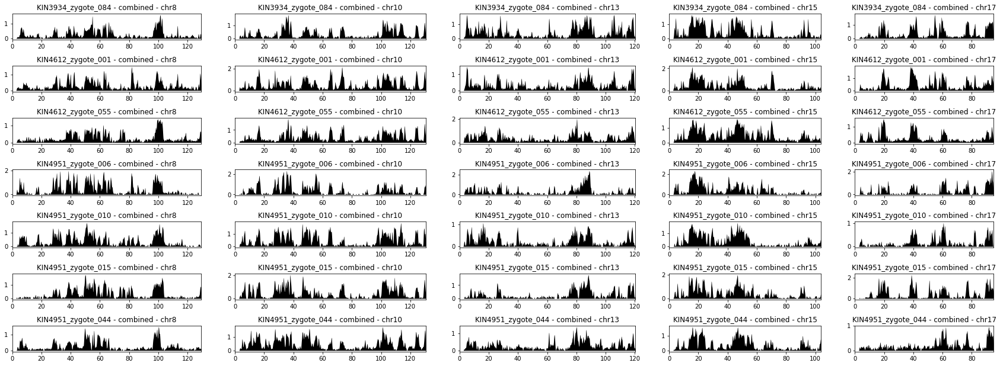

In [31]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'zygote', 'homozygous', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN3934_zygote_084', 'KIN4612_zygote_001', 'KIN4612_zygote_055', 
    'KIN4951_zygote_006', 'KIN4951_zygote_010', 'KIN4951_zygote_015',
    'KIN4951_zygote_044', 
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_zygote_Lmnb1_CBABL6F1_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.3 Zygote - Lmnb1 - F1xCAST

5 5 None


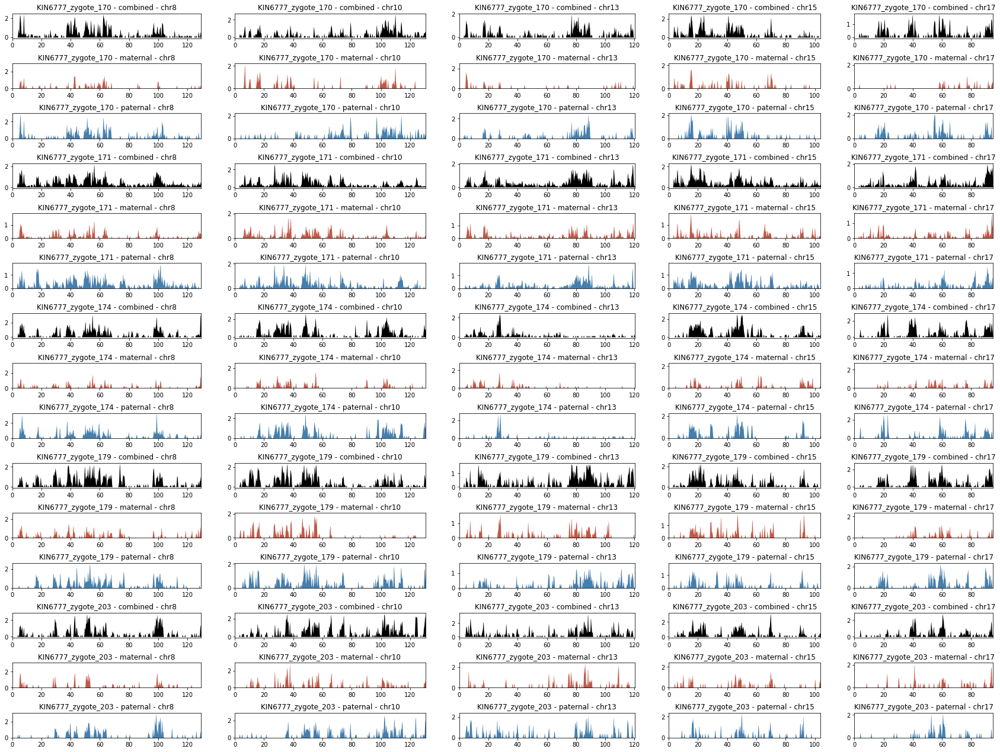

In [32]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'zygote', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN6777_zygote_170', 'KIN6777_zygote_171', 'KIN6777_zygote_174', 
    'KIN6777_zygote_179', 'KIN6777_zygote_203'
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_zygote_Lmnb1_CBABL6F1xCAST_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.4 2-cell - Lmnb1 - homozygous

12 12 None


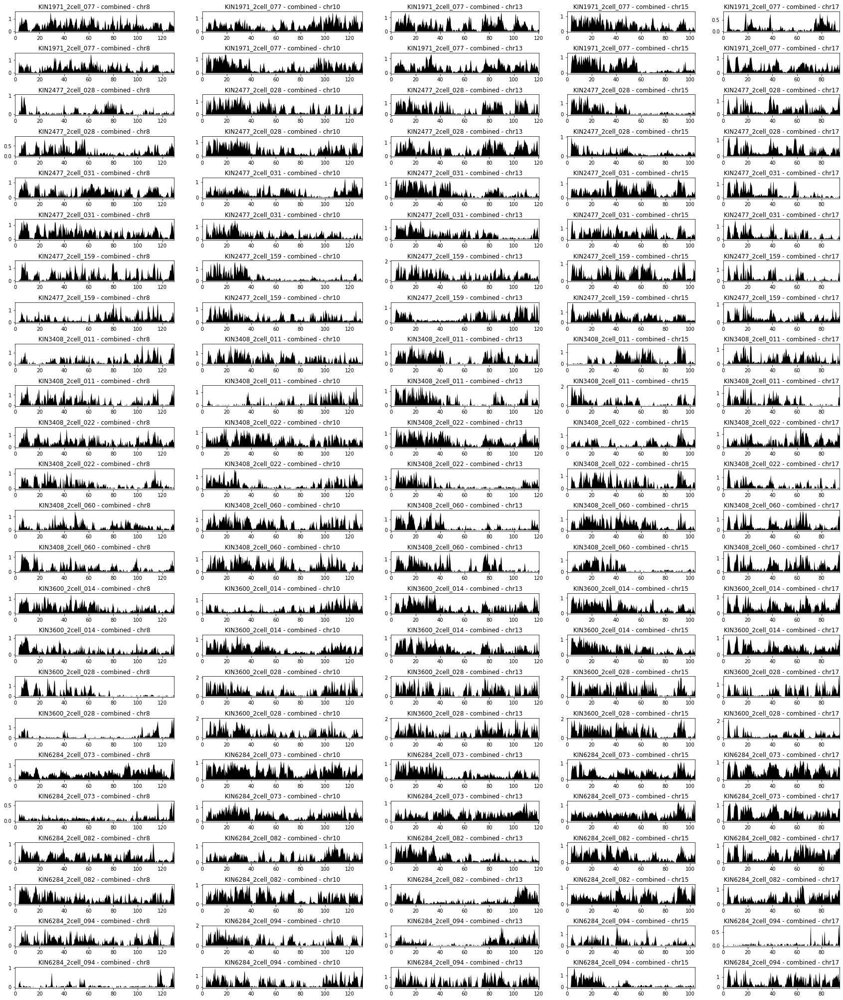

In [33]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'homozygous', 'no_treatment')

n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN1971_2cell_077', 'KIN2477_2cell_028', 'KIN2477_2cell_031', 
    'KIN2477_2cell_159', 'KIN3408_2cell_011', 'KIN3408_2cell_022', 
    'KIN3408_2cell_060', 'KIN3600_2cell_014', 'KIN3600_2cell_028', 
    'KIN6284_2cell_073', 'KIN6284_2cell_082', 'KIN6284_2cell_094'
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.5 2-cell - Lmnb1 - homozygous - Lap2b

0 7 10


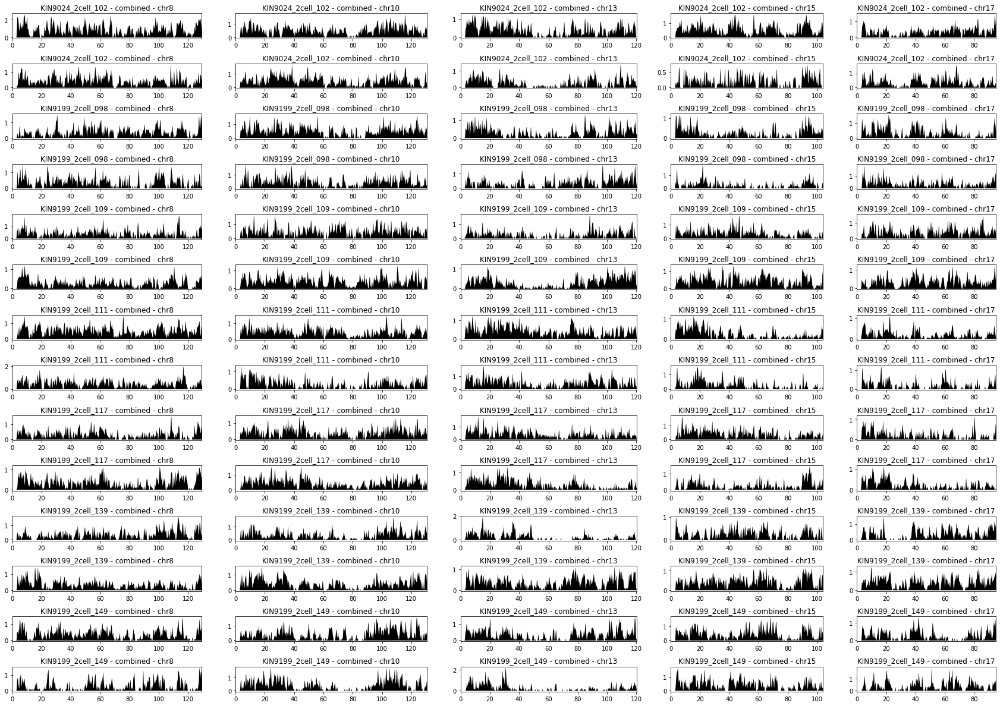

In [34]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'homozygous', 'Lap2b')

n_embryos = 10
min_cells_per_embryo = 2

eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1_Lap2b_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.6 2-cell - Lmnb1 - homozygous - Cbx7-Lap2b

0 10 10


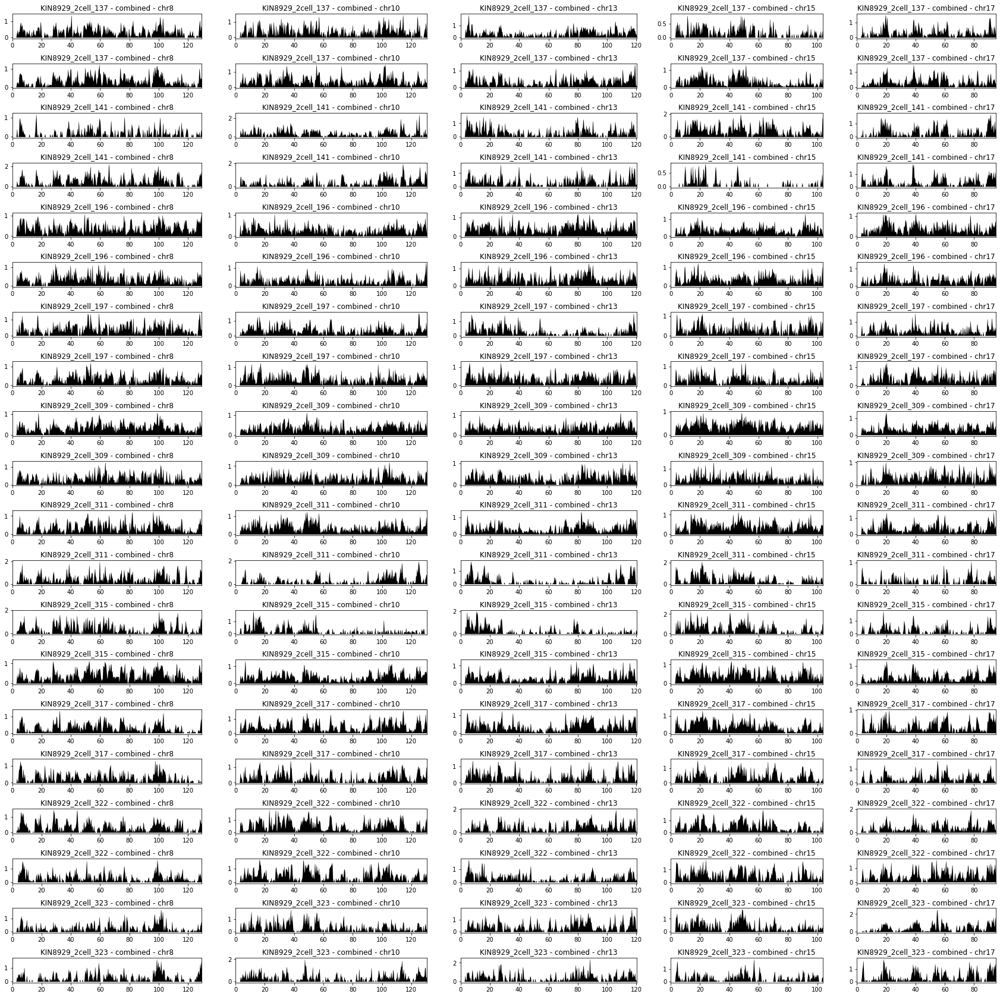

In [35]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'homozygous', 'Cbx7(CD)-Lap2b')

n_embryos = 10
min_cells_per_embryo = 2

eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1_Cbx7-Lap2b_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.7 2-cell - Lmnb1 - F1xCAST

6 6 None


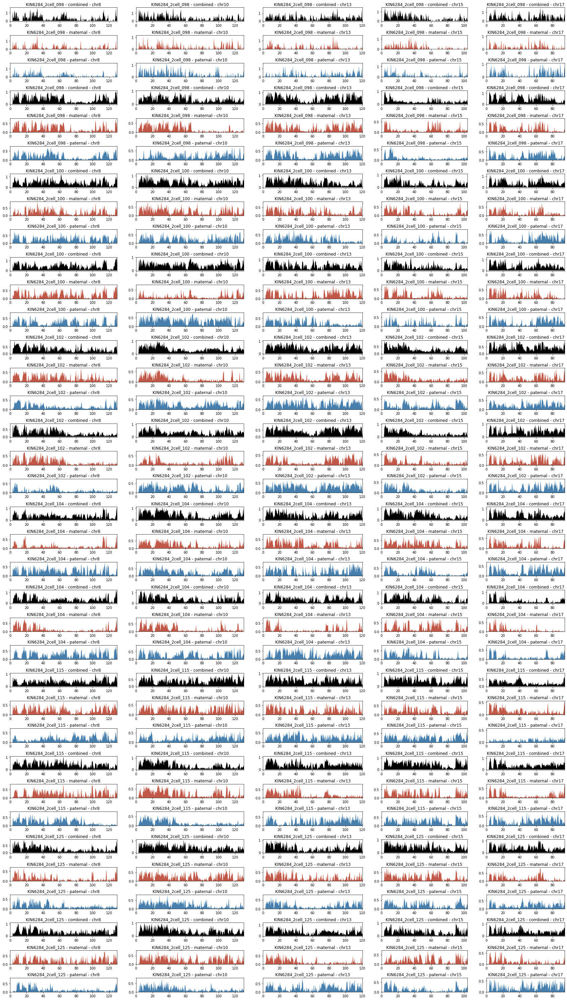

In [37]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN6284_2cell_098', 'KIN6284_2cell_100', 'KIN6284_2cell_102', 'KIN6284_2cell_104',
    'KIN6284_2cell_115', 'KIN6284_2cell_125'
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1xCAST_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.8 2-cell - Lmnb1 - F1xCAST - Lap2b

0 6 10


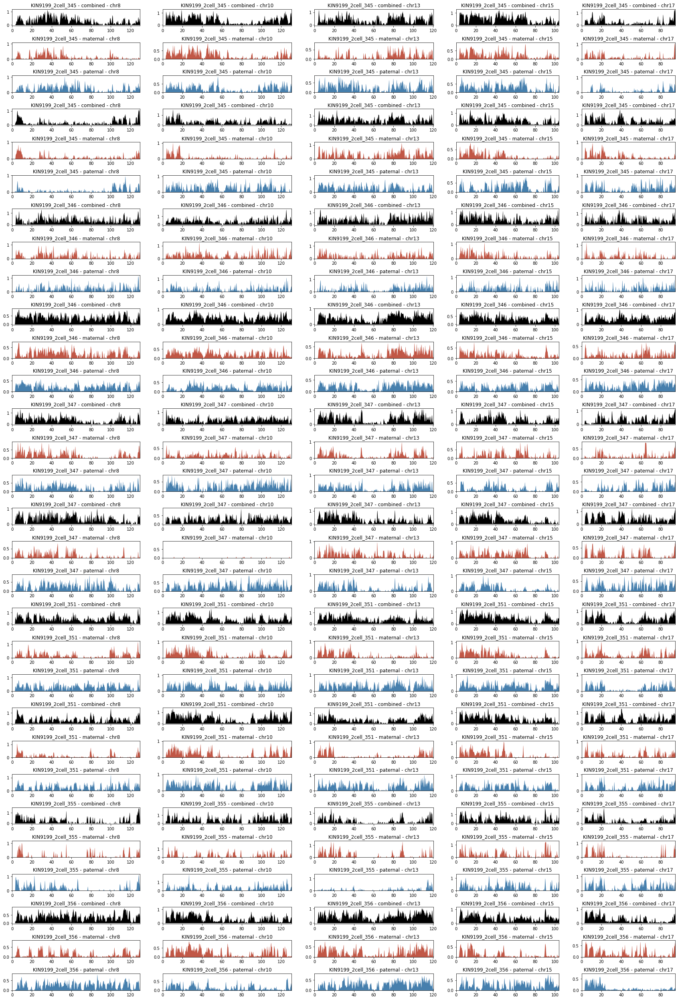

In [43]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b')
n_embryos = 10
min_cells_per_embryo = 1
eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1xCAST_Lap2b_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.9 2-cell - Lmnb1 - F1xCAST - Cbx7-Lap2b

0 10 10


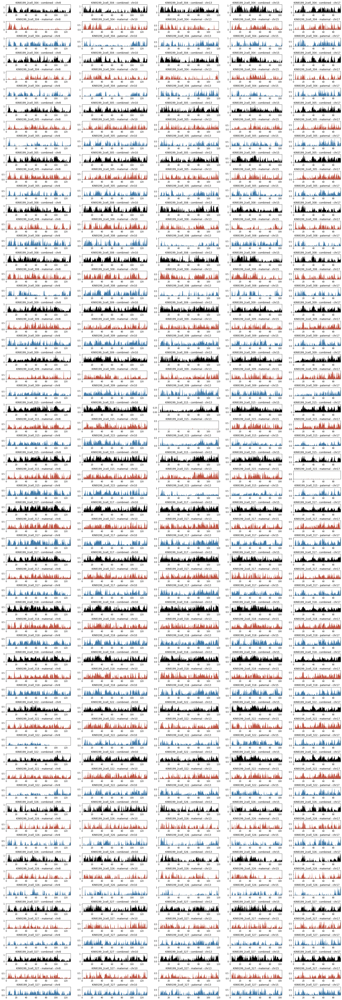

In [45]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b')
n_embryos = 10
min_cells_per_embryo = 2
eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_CBABL6F1xCAST_Cbx7-Lap2b_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.10 2-cell - Lmnb1 - BL6xJF1

8 8 None


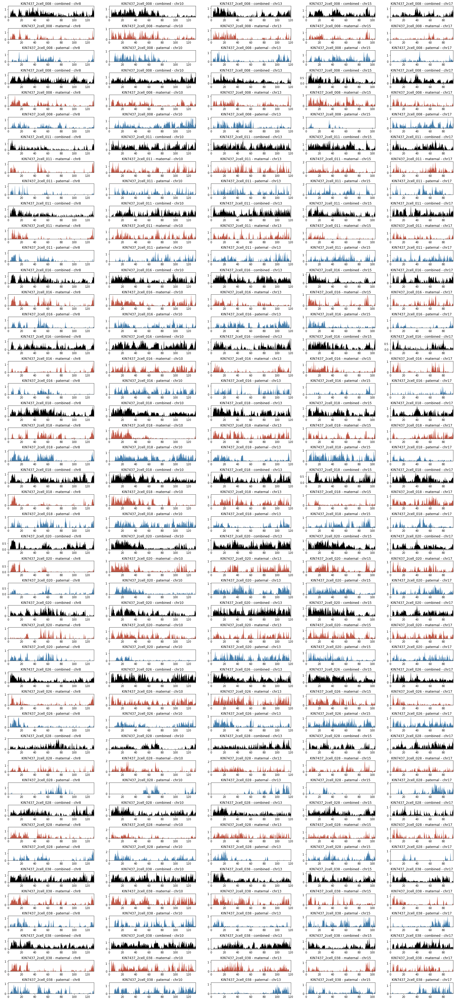

In [46]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN7437_2cell_008', 'KIN7437_2cell_011', 'KIN7437_2cell_016', 
    'KIN7437_2cell_018', 'KIN7437_2cell_020', 'KIN7437_2cell_026', 
    'KIN7437_2cell_028', 'KIN7437_2cell_038'
    
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_BL6xJF1-WT_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.11 2-cell - Lmnb1 - BL6xJF1 - EED mKO

8 8 None


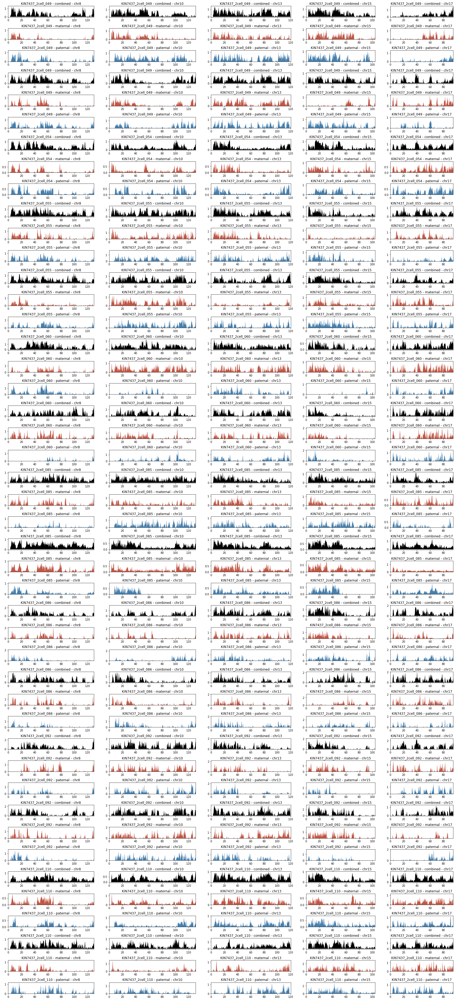

In [47]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN7437_2cell_049', 
    'KIN7437_2cell_054', 'KIN7437_2cell_055', 'KIN7437_2cell_060', 
    'KIN7437_2cell_085', 'KIN7437_2cell_086','KIN7437_2cell_092', 
    'KIN7437_2cell_110'
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_2cell_Lmnb1_BL6xJF1-EEDmKO_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.12 8-cell - Lmnb1 - homozygous

7 7 None


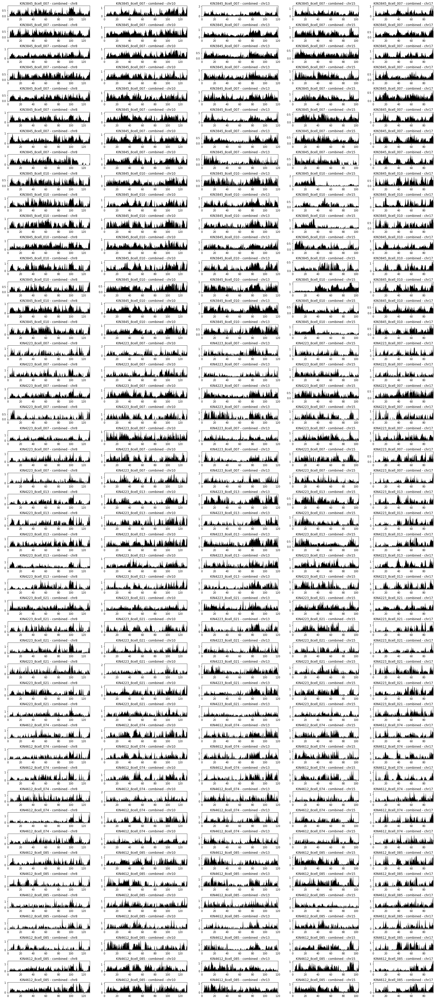

In [48]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '8cell', 'homozygous', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN3845_8cell_007', 'KIN3845_8cell_010', 'KIN4223_8cell_007', 
    'KIN4223_8cell_013', 'KIN4223_8cell_021', 'KIN4612_8cell_074', 
    'KIN4612_8cell_085'
]

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_8cell_Lmnb1_CBABL6F1_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.13 8-cell - Lmnb1 - F1xCAST

0 10 10


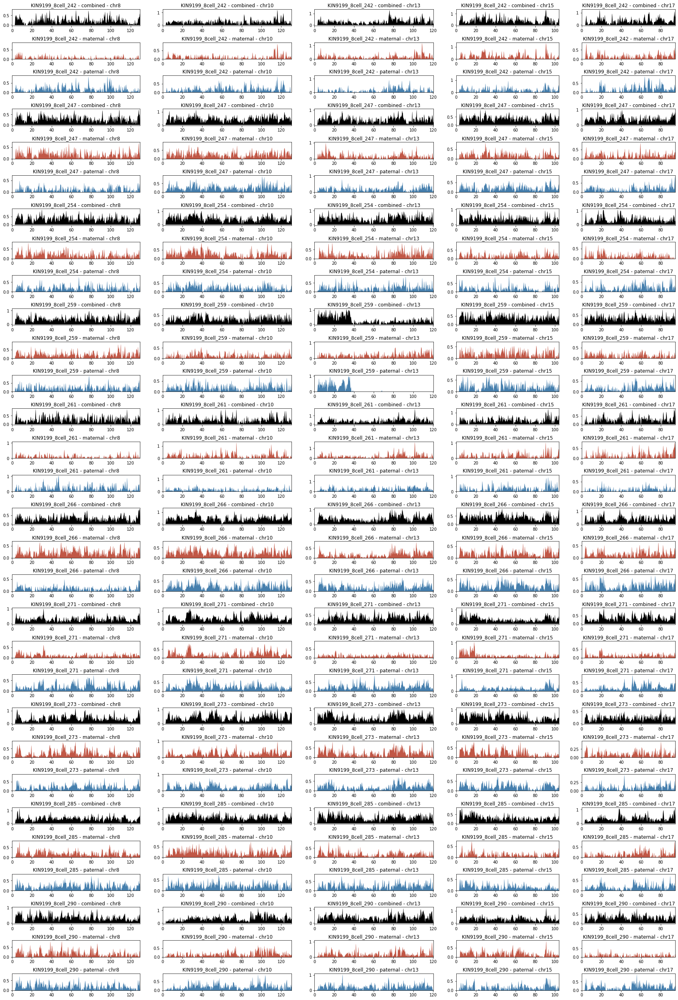

In [49]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '8cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
n_embryos = 10
min_cells_per_embryo = 1

eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_8cell_Lmnb1_CBABL6F1xCAST_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.14 8-cell - Lmnb1 - F1xCAST - Cbx7-Lap2b

0 10 10


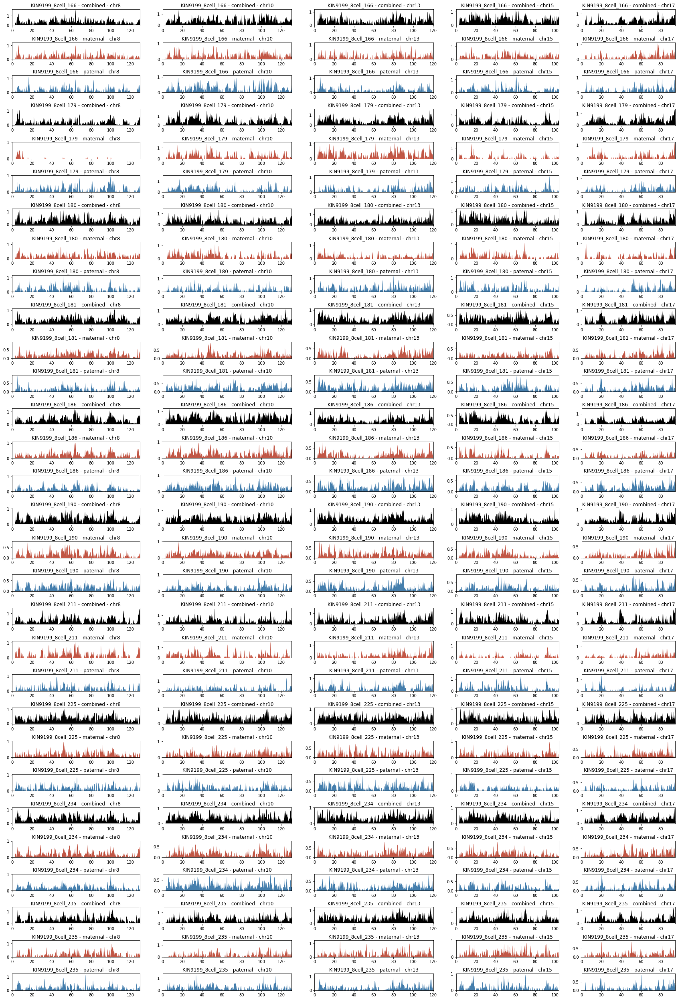

In [50]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '8cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b')
n_embryos = 10
min_cells_per_embryo = 1
eid = []

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, selected_embryos=eid)

outfn = FIGOUTDIR + 'example_profiles_8cell_Lmnb1_CBABL6F1xCAST_Cbx7-Lap2b_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

## 4.15 mESC - Lmnb1 - 129S1xCAST

0 1 1


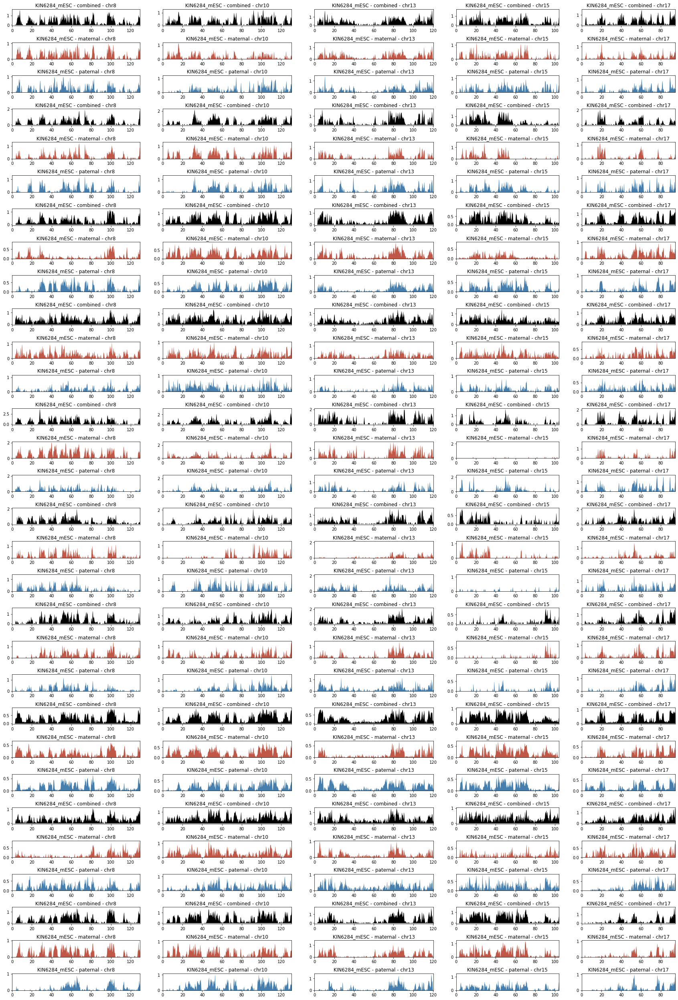

In [51]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment')
n_embryos = 1
min_cells_per_embryo = 10

plot_example_tracks_per_embryo(info, n_embryos, min_cells_per_embryo, chroms_to_plot, plot_alleles=True)

outfn = FIGOUTDIR + 'example_profiles_mESC_Lmnb1_129S1xCAST_chr{}.pdf'.format('-'.join(chroms_to_plot))
plt.savefig(outfn, bbox_inches='tight')

# 5. Single-cell profile examples - with expression

## 5.1 Function to plot single-cell example profiles - with expression

In [52]:
def plot_example_tracks_per_embryo_w_expr(
    info, n_embryos, min_cells_per_embryo, selected_embryos, 
    chrom, interval=[], 
    plot_alleles=True, figw=10, plot_celseq=True):

    # select data
    ind = (anno.fusion_construct == info[0]) & (anno.stage==info[1]) & (anno.genotype==info[2]) & (anno.treatment==info[3])
    is_het = info[2] in GENOTYPE2PARENT
    annotmp = anno[ind].copy()
    embryos_to_plot = select_random_cells(selected_embryos, n_embryos, min_cells_per_embryo, annotmp, with_celseq=True)
    
    # set smoothing kernel
    smooth_std = 200000
    W = gaussian(np.ceil(smooth_std / BINSIZE * 6 / 2) * 2 + 1, smooth_std / BINSIZE)
    W /= W.sum()
    
    # determine which bins to select
    plot_interval = len(interval) == 2
    if plot_interval:
        loc_ind = np.arange(int(interval[0]//BINSIZE), int(np.ceil(interval[1]//BINSIZE)))
        figwidth = figw
    else:
        loc_ind = np.arange(0, len(mapab[chrom]))
        figwidth = len(mapab[chrom]) / len(mapab['1']) * figw
        
    
    # prepare plot
    if (is_het and plot_alleles):
        nrow = annotmp.embryo_id.isin(embryos_to_plot).sum() * 3 if info[1] != 'mESC' else min_cells_per_embryo*3
    else:
        nrow = annotmp.embryo_id.isin(embryos_to_plot).sum() if info[1] != 'mESC' else min_cells_per_embryo

    fig, axes = plt.subplots(nrow, 2, figsize=(figwidth*2, 1.5*nrow))
    plt.subplots_adjust(hspace=1)
    r_counter = 0

    np.random.seed(1)

    # select plotting dataframe
    toplot = annotmp[annotmp.embryo_id.isin(embryos_to_plot)].sort_values(by=['embryo_id'])
    if info[1] == 'mESC':
        ind = np.random.choice(toplot.index.values, min_cells_per_embryo, replace=False)
        toplot = toplot.loc[ind,:]
    parents = ['combined', 'maternal', 'paternal'] if (is_het and plot_alleles) else ['combined']
    

    for sample, row in toplot.iterrows():
        
        plot_dict = {'damid': dict(), 'celseq': dict()}

        for parent in parents:
            
            # select DamID data
            counts = damid_counts[parent][sample]
            if parent == 'combined':
                counts = rpkm_normalize(counts, binsize=BINSIZE)
            else:
                d = anno.loc[sample,'maternal_damid_counts'] + anno.loc[sample, 'paternal_damid_counts']
                counts = rpkm_normalize(counts, depth=d, binsize=BINSIZE)
                
            counts_smooth = fftconvolve(counts[chrom], W, mode='same')
            
            if info[0] not in ['Dam-Lmnb1', 'Dam-only']:
                assert parent == 'combined'
                assert info[2] == 'homozygous'
                
                ctrlinfo = ('Dam-only', info[1], info[2], info[3])
                assert ctrlinfo in damid_insilico_rpkm[parent]
                
                ctrl = np.copy(damid_insilico_rpkm[parent][ctrlinfo][chrom])
                ctrl = fftconvolve(ctrl, W, mode='same')
                
                counts_smooth = np.log2( (counts_smooth + .1) / (ctrl + .1) )
                counts_smooth = counts_smooth.clip(0, counts_smooth.max())

            plot_dict['damid'][parent] = counts_smooth
            
            # select CELseq data
            if sample in celseq_tracks[parent]:
                expr = celseq_tracks[parent][sample][chrom]
                celseq_available = True
            else:
                expr = np.zeros(len(mapab[chrom]))
                celseq_available = False
            plot_dict['celseq'][parent] = fftconvolve(expr, W, mode='same')
            
        # determine Y-scale
        if plot_interval:
            ymin_damid = max([plot_dict['damid'][p][loc_ind].min() for p in parents])
            ymax_damid = max([plot_dict['damid'][p][loc_ind].max() for p in parents])
            ymax_celseq = max([plot_dict['celseq'][p][loc_ind].max() for p in parents])
        else:
            ymin_damid = max([plot_dict['damid'][p].min() for p in parents])
            ymax_damid = max([plot_dict['damid'][p].max() for p in parents])
            ymax_celseq = max([plot_dict['celseq'][p].max() for p in parents])
        
        for parent in parents:
            Yd = plot_dict['damid'][parent]
            Ye = plot_dict['celseq'][parent]
            X = np.arange(0, len(Ye)*BINSIZE, BINSIZE)/1e6
            assert len(Ye) == len(Yd)
            
            if plot_interval:
                Yd = Yd[loc_ind]
                Ye = Ye[loc_ind]
                X = X[loc_ind]

            # plot DamID data
            ax0 = axes[r_counter,0]
            if parent != 'combined':
                ax0.fill_between(X, 0, Yd, color=color_dict['allele'][parent], lw=0)
            else:
                ax0.fill_between(X, 0, Yd, color='k', lw=0)
            ax0.set_title('DamID - %s - %s - chr%s' % (row['embryo_id'], parent, chrom))
            if info[0] not in ['Dam-Lmnb1', 'Dam-only']:
                ax0.set_ylabel('log2OE\n(pos. only)')
            else:
                ax0.set_ylabel('RPKM')
                
            # plot CELseq data
            ax1 = axes[r_counter,1]
            if parent != 'combined':
                ax1.fill_between(X, 0, Ye, color=color_dict['allele'][parent], lw=0)
            else:
                ax1.fill_between(X, 0, Ye, color='k', lw=0)
            if celseq_available:
                ax1.set_title('CELseq', ha='right', loc='right')
            else:
                ax1.set_title('NO CELseq AVAILABLE', ha='right', loc='right')
            ax1.set_ylabel('lognorm')
            ax1.set_ylim(0,ymax_celseq*1.05)
            
            # plot CELseq data as heatmap underneath DamID
            if plot_celseq:
                ymin = ymin_damid - (ymax_damid-ymin_damid)*0.2
                C = np.atleast_2d(Ye)
                ax0.imshow(C, extent=[X[0], X[-1], ymin, ymin_damid], aspect='auto', cmap='bone_r', vmin=0, vmax=ymax_celseq)
                ax0.set_ylim(ymin, ymax_damid*1.05)
            else:
                ax0.set_ylim(ymin_damid, ymax_damid*1.05)
            
            for icol in [0, 1]:
                ax = axes[r_counter, icol]
                ax.set_xlim(X[0], X[-1])
                
            if not plot_celseq:
                ax1.remove()

            r_counter += 1

## 5.2 Zygote - Lmnb1 - homozygous

In [7]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'zygote', 'homozygous', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN3934_zygote_084', 'KIN4612_zygote_001', 'KIN4612_zygote_055', 
    'KIN4951_zygote_006', 'KIN4951_zygote_010', 'KIN4951_zygote_015',
    'KIN4951_zygote_044', 
]

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )

    outfn = FIGOUTDIR + 'example_profiles_with_expr.zygote_Lmnb1_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.3 Zygote - Lmnb1 - F1xCAST

In [8]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'zygote', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN6777_zygote_170', 'KIN6777_zygote_171', 'KIN6777_zygote_174', 
    'KIN6777_zygote_179', 'KIN6777_zygote_203'
]

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.zygote_Lmnb1_CBABL6F1xCAST_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.4 2-cell - Lmnb1 - homozygous

In [9]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'homozygous', 'no_treatment')

n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN1971_2cell_077', 'KIN2477_2cell_028', 'KIN2477_2cell_031', 
    'KIN2477_2cell_159', 'KIN3408_2cell_011', 'KIN3408_2cell_022', 
    'KIN3408_2cell_060', 'KIN3600_2cell_014', 'KIN3600_2cell_028', 
    'KIN6284_2cell_073', 'KIN6284_2cell_082', 'KIN6284_2cell_094'
]

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Lmnb1_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.5 2-cell - Lmnb1 - F1xCAST

In [10]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN6284_2cell_098', 'KIN6284_2cell_100', 'KIN6284_2cell_102', 'KIN6284_2cell_104',
    'KIN6284_2cell_115', 'KIN6284_2cell_125'
]

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Lmnb1_CBABL6F1xCAST_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.6 2-cell - Lmnb1 - BL6xJF1 - EED ctrl

In [11]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN7437_2cell_008', 'KIN7437_2cell_011', 'KIN7437_2cell_016', 
    'KIN7437_2cell_018', 'KIN7437_2cell_020', 'KIN7437_2cell_026', 
    'KIN7437_2cell_028', 'KIN7437_2cell_038'
    
]

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Lmnb1_BL6xJF1-WT_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.7 2-cell - Lmnb1 - BL6xJF1 - EED mKO

In [12]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN6284_2cell_012', 'KIN6284_2cell_016', 'KIN7437_2cell_049', 
    'KIN7437_2cell_054', 'KIN7437_2cell_055', 'KIN7437_2cell_060', 
    'KIN7437_2cell_085', 'KIN7437_2cell_086','KIN7437_2cell_092', 
    'KIN7437_2cell_110'
]

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Lmnb1_BL6xJF1-EEDmKO_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.8 8-cell - Lmnb1 - homozygous

In [13]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', '8cell', 'homozygous', 'no_treatment')
n_embryos = None
min_cells_per_embryo = None

eid = [
    'KIN3845_8cell_007', 'KIN3845_8cell_010', 'KIN4223_8cell_007', 
    'KIN4223_8cell_013', 'KIN4223_8cell_021', 'KIN4612_8cell_074', 
    'KIN4612_8cell_085'
]

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.8cell_Lmnb1_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.9 mESC - Lmnb1 - 129S1xCAST

In [14]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Lmnb1', 'mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment')
n_embryos = 1
min_cells_per_embryo = 10

for chrom in chroms_to_plot:

    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=[], 
        chrom=chrom, interval=[]
    )
    
    outfn = FIGOUTDIR + 'example_profiles_with_expr.mESC_Lmnb1_129S1xCAST_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.10 2-cell - Cbx1(CD) - homozygous

In [15]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Cbx1(CD)', '2cell', 'homozygous', 'no_treatment')

n_embryos = 20
min_cells_per_embryo = 2

eid = []

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Cbx1(CD)_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.11 2-cell - Cbx1(FL) - homozygous

In [16]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-Cbx1(CD)', '2cell', 'homozygous', 'no_treatment')

n_embryos = 20
min_cells_per_embryo = 2

eid = []

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_Cbx1(FL)_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.12 2-cell - aH3K27me3 - homozygous

In [17]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-aH3K27me3', '2cell', 'homozygous', 'no_treatment')

n_embryos = 20
min_cells_per_embryo = 2

eid = []

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_aH3K27me3_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.13 2-cell - Dam-only - homozygous

In [18]:
chroms_to_plot = ['8', '10', '13', '15', '17']
info = ('Dam-only', '2cell', 'homozygous', 'no_treatment')

n_embryos = 20
min_cells_per_embryo = 2

eid = []

for chrom in chroms_to_plot:
    
    plot_example_tracks_per_embryo_w_expr(
        info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
        chrom=chrom, interval=[]
    )
    outfn = FIGOUTDIR + 'example_profiles_with_expr.2cell_DamOnly_CBABL6F1_chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    
    if chrom != '15':
        plt.close()

## 5.14 General use colorbar for expression heatmaps/tracks

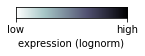

In [65]:
fig, ax = plt.subplots(figsize=(2,.2))
p = ax.imshow(
    np.atleast_2d(np.arange(0,255)), extent=[0,1,0,1], aspect='auto',
    cmap='bone_r'
)
ax.set_yticks([])
ax.set_xticks([0,1])
ax.set_xticklabels(['low', 'high'])
ax.set_xlabel('expression (lognorm)')

outfn = FIGOUTDIR + 'example_profiles_with_expr.general_use_colorbar.pdf'
plt.savefig(outfn, bbox_inches='tight')

## 5.15 Plotting zoom-in of variable region

In [66]:
regions_to_plot = [
    ['8', [60e6, 80e6]],
    ['8', [90e6, 110e6]],
    ['5', [30e6, 50e6]]
]

conditions = [
    ('Dam-aH3K27me3', '2cell', 'homozygous', 'no_treatment'),
    ('Dam-Cbx1(CD)', '2cell', 'homozygous', 'no_treatment'),
    ('Cbx1(FL)-Dam', '2cell', 'homozygous', 'no_treatment'),
    ('Dam-Lmnb1', '2cell', 'homozygous', 'no_treatment'),
    ('Dam-only', '2cell', 'homozygous', 'no_treatment')
]

for chrom, interval in regions_to_plot:
    for info in conditions:

        if info[0] == 'Lmnb1':
            eid = [
                'KIN1971_2cell_077', 'KIN2477_2cell_028', 'KIN2477_2cell_031', 
                'KIN2477_2cell_159', 'KIN3408_2cell_011', 'KIN3408_2cell_022', 
                'KIN3408_2cell_060', 'KIN3600_2cell_014', 'KIN3600_2cell_028', 
                'KIN6284_2cell_073', 'KIN6284_2cell_082', 'KIN6284_2cell_094'
            ]
        else:
            n_embryos = 20
            min_cells_per_embryo = 2
            eid = []

        plot_example_tracks_per_embryo_w_expr(
            info, n_embryos, min_cells_per_embryo, selected_embryos=eid, 
            chrom=chrom, interval=interval, figw=2, plot_celseq=False
        )

        outfn = FIGOUTDIR + 'zoomin_chr%s_%d_%d.example_profiles.2cell_%s_CBABL6F1.pdf' % (chrom, interval[0], interval[1], info[0])
        plt.savefig(outfn, bbox_inches='tight')
        plt.close()

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_12727/871930686.py:131: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax1.set_ylim(0,ymax_celseq*1.05)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_12727/871930686.py:131: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax1.set_ylim(0,ymax_celseq*1.05)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_12727/871930686.py:131: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax1.set_ylim(0,ymax_celseq*1.05)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_12727/871930686.py:131: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax1.set_ylim(0,ymax_celseq*1.05)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_12727

# 6. Plotting _in silico_ populations and heatmaps

## 6.1 Function to plot heatmaps and _in silico_ populations

In [67]:
CONSTRUCT2TARGET = {
    'Dam-Cbx1(FL)': 'H3K9me3',
    'Dam-Cbx1(CD)': 'H3K9me3',
    'Dam-aH3K27me3': 'H3K27me3',
    'Dam-only': 'accessibility'
}

In [68]:
def plot_in_silico_pops(
    anno_to_plot, chroms_to_plot, 
    max_n_cells = np.inf, plot_alleles=True, color_by='stage', 
    plot_external = False,
    max_chrw=10, rel_h=0.05):
    
    if plot_alleles and plot_external:
        print('External data is only plotted non-allelically.')

    # set smoothing kernel
    smooth_std = 200000
    W = gaussian(np.ceil(smooth_std / BINSIZE * 6 / 2) * 2 + 1, smooth_std / BINSIZE)
    W /= W.sum()
    
    # prepare plot
    g_anno = anno_to_plot.groupby(['fusion_construct', 'stage', 'genotype', 'treatment'])
    
    hr = list()
    for info, df in g_anno:
        
        # add rows for external data
        if plot_external and (info[0] in CONSTRUCT2TARGET):
            for _, row in ext_anno[ext_anno.target == CONSTRUCT2TARGET[info[0]]].iterrows():
                if plot_alleles and row['is_heterozygous']:
                    hr.append([30,30,30])
                else:
                    hr.append([30])
        
        # add rows for our own data
        n = min(len(df), max_n_cells)
        if (info[2] in GENOTYPE2PARENT) and plot_alleles:
            na = min(df.DamID_PASS_allelic.sum(), max_n_cells)
            hr.append([30, 30, n, 30, 30, na, 30, 30, na])
        else:
            hr.append([30, 30, n])
    hr = np.concatenate(hr)
    nrow = len(hr)
    
    ncol = len(chroms_to_plot)
    chrlens = np.array([len(mapab[c]) for c in chroms_to_plot])
    width_ratios = chrlens / max(chrlens)
    figwidth = sum([ len(mapab[c])/len(mapab['1']) for c in chroms_to_plot ])*max_chrw

    fig, axes = plt.subplots(
        nrow, ncol, 
        figsize=(figwidth, sum(hr)*rel_h), gridspec_kw={'width_ratios': width_ratios, 'height_ratios': hr}
    )
    plt.subplots_adjust(hspace=1)
    r_counter = 0

    np.random.seed(1)

    for info, df in g_anno:
        
        # plot external data
        if plot_external and (info[0] in CONSTRUCT2TARGET):
            
            for _, row in ext_anno[ext_anno.target == CONSTRUCT2TARGET[info[0]]].iterrows():
                is_het = row['is_heterozygous']
                parents = ['combined', 'maternal', 'paternal'] if (is_het and plot_alleles) else ['combined']
                
                for parent in parents:
                    for c_counter, chrom in enumerate(chroms_to_plot):
                        ax = axes[r_counter,c_counter] if ncol > 1 else axes[r_counter]
                        
                        Y = ext_data[parent][row['sample_id']][chrom]
                        Y = fftconvolve(Y, W, mode='same')
                        if row['control_id'] != 'none':
                            Yctrl = ext_data[parent][row['control_id']][chrom]
                            Yctrl = fftconvolve(Yctrl, W, mode='same')
                            Y = np.log2( (Y + .1) / (Yctrl + .1) )
                            ylabel = 'log2OE'
                        else:
                            ylabel = 'RPKM'
                        X = np.arange(0, len(Y)*BINSIZE, BINSIZE) / 1e6
                        
                        clr = color_dict['target'][row['target']] if parent == 'combined' else color_dict['alelle'][parent]
                        ax.fill_between(X, 0, Y, color=clr, alpha=.6, lw=0)
                        ax.set_title('%s - %s - %s - %s' % (row['sample_id'], row['target'], row['stage'], parent))
                        ax.set_ylabel(ylabel)
                        ax.set_xlim(X[0], X[-1])
                    
                    r_counter += 1
        
        # plot our own data
        is_het = info[2] in GENOTYPE2PARENT
        parents = ['combined', 'maternal', 'paternal'] if (is_het and plot_alleles) else ['combined']

        for parent in parents:
            
            # determine color
            if color_by == 'stage':
                clr = color_dict['stage'][info[1]]
            elif (color_by == 'allele') or (color_by == 'parent'):
                clr = color_dict['allele'][parent]
            elif color_by == 'fusion_construct':
                clr = color_dict['fusion_construct'][info[0]]
            else:
                print('color_by argument not recognized, defaulting to black')
                clr = 'k'

            for c_counter, chrom in enumerate(chroms_to_plot):

                ax0 = axes[r_counter,c_counter] if ncol > 1 else axes[r_counter]
                ax1 = axes[r_counter+1,c_counter] if ncol > 1 else axes[r_counter+1]
                ax2 = axes[r_counter+2,c_counter] if ncol > 1 else axes[r_counter+2]
                
                # plot in silico population - log2OE
                Y = damid_insilico_rpkm[parent][info][chrom]
                Y = fftconvolve(Y, W, mode='same')
                controlinfo = ('Dam-only', info[1], info[2], info[3])
                if (info[0] in ['Dam-Lmnb1', 'Dam-only']) or (controlinfo not in damid_insilico_rpkm[parent]):
                    control = mapab_rpkm[info[2]][parent][chrom]
                    ylabel = 'log2OE map'
                else:
                    control = damid_insilico_rpkm[parent][controlinfo][chrom]
                    ylabel = 'log2OE dam'
                Yctrl = fftconvolve(control, W, mode='same')
                Yoe = np.log2( (Y + .1) / (Yctrl + .1) )
                X = np.arange(0, len(Yoe)*BINSIZE, BINSIZE) / 1e6
                
                ax0.fill_between(X, 0, Yoe, color=clr, lw=0)
                ax0.set_ylabel(ylabel)
                t0 = '%s - %s - %s - %s' % info
                t1 = '\nin silico %s - chr%s' % (ylabel, chrom)
                ax0.set_title(t0+t1)
                ax0.set_xlim(X[0], X[-1])
                
                # plot CF
                Y = contact_freq[parent][info][chrom]
                ax1.fill_between(X, 0, Y, color=clr, lw=0)
                ax1.set_ylabel('CF')
                t1 = '\nCF - chr%s' % chrom
                ax1.set_title(t0+t1)
                ax1.set_xlim(X[0], X[-1])
                
                # plot binary contacts
                ind = df.DamID_PASS if parent == 'combined' else df.DamID_PASS_allelic
                n = int(min(max_n_cells, len(df)))
                dfsorted = df[ind].sort_values(by='unique_damid_counts').iloc[-n:,]
                C = np.array([damid_binary[parent][s][chrom] for s in dfsorted.index.values])
                ax2.imshow(
                    C, extent=[0,X[-1],0,C.shape[0]], 
                    origin='lower', aspect='auto', 
                    cmap='binary', vmin=0, vmax=1
                )
                t1 = '\nsingle-cell contacts - chr%s' % chrom
                ax2.set_title(t0+t1)
                
                if parent == 'paternal':
                    for i, ax in [(3, ax0), (2, ax1)]:
                        axm = axes[r_counter-i, c_counter] if ncol > 1 else axes[r_counter-i]
                        ymax = max(ax.get_ylim()[1], axm.get_ylim()[1])
                        ymin = min(ax.get_ylim()[0], axm.get_ylim()[0])
                        ax.set_ylim(ymin, ymax)
                        axm.set_ylim(ymin, ymax)

            r_counter += 3

## 6.2 Lmnb1 samples, non-allelic representation

In [6]:
chroms_to_plot = ['1', '5', '8']

anno_to_plot = anno[(anno.fusion_construct=='Dam-Lmnb1')]
plot_in_silico_pops(anno_to_plot, chroms_to_plot, max_n_cells = np.inf, plot_alleles=False, color_by='stage')

plt.show()
plt.close()

In [70]:
anno_to_plot = anno[(anno.fusion_construct=='Dam-Lmnb1')]

for chrom in chrom_order:
    plot_in_silico_pops(anno_to_plot, [chrom], max_n_cells = np.inf, plot_alleles=False, color_by='stage')
    outfn = FIGOUTDIR + 'insilico_profiles_and_heatmaps.Lmnb1.all_stages.all_conditions.non_allelic.chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    plt.close()

## 6.3 Heterozyous Lmnb1 samples

In [2]:
chroms_to_plot = ['1', '5']

anno_to_plot = anno[(anno.is_heterozygous) & (anno.fusion_construct=='Dam-Lmnb1')]
plot_in_silico_pops(anno_to_plot, chroms_to_plot, max_n_cells = np.inf, plot_alleles=True, color_by='allele')

plt.show()
plt.close()

In [72]:
anno_to_plot = anno[(anno.is_heterozygous) & (anno.fusion_construct=='Dam-Lmnb1')]

for chrom in chrom_order:
    plot_in_silico_pops(anno_to_plot, [chrom], max_n_cells = np.inf, plot_alleles=True, color_by='allele')
    outfn = FIGOUTDIR + 'insilico_profiles_and_heatmaps.Lmnb1.all_stages.heterozygous_samples.allelic.chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    plt.close()

## Other constructs

In [3]:
chroms_to_plot = ['1', '5', '8']

anno_to_plot = anno[(anno.stage == '2cell') & (~anno.is_heterozygous)]
plot_in_silico_pops(
    anno_to_plot, chroms_to_plot, 
    max_n_cells = np.inf, plot_alleles=False, color_by='fusion_construct',
    plot_external=True
)

plt.show()
plt.close()

In [74]:
anno_to_plot = anno[(anno.stage == '2cell') & (~anno.is_heterozygous)]

for chrom in chrom_order:
    plot_in_silico_pops(
        anno_to_plot, [chrom], max_n_cells = np.inf, 
        plot_alleles=False, color_by='fusion_construct',
        plot_external=True
    )
    outfn = FIGOUTDIR + 'insilico_profiles_and_heatmaps.all_constructs.2cell_stage.homozygous.non_allelic.chr{}.pdf'.format(chrom)
    plt.savefig(outfn, bbox_inches='tight')
    plt.close()